In [1]:
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()
from src.utils.notebook_imports import *
from pyforest import *
import glob
import os
import logging
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as se
%matplotlib inline
plt.rcParams.update({'font.size': 15})
%reload_ext autoreload
%autoreload 2
from ipywidgets import interact
# define jupyter size
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))


search for root_dir and set working directory
Working directory set to: /mnt/data/git/cardio


## Load metadata as csv or xls

In [2]:
df = pd.read_csv('data/external/metadata_joined.csv',error_bad_lines=False)

b'Skipping line 8: expected 31 fields, saw 32\nSkipping line 18: expected 31 fields, saw 32\nSkipping line 21: expected 31 fields, saw 32\nSkipping line 37: expected 31 fields, saw 32\nSkipping line 43: expected 31 fields, saw 33\nSkipping line 66: expected 31 fields, saw 33\nSkipping line 75: expected 31 fields, saw 32\nSkipping line 76: expected 31 fields, saw 33\nSkipping line 87: expected 31 fields, saw 32\nSkipping line 89: expected 31 fields, saw 32\nSkipping line 93: expected 31 fields, saw 33\nSkipping line 94: expected 31 fields, saw 32\nSkipping line 107: expected 31 fields, saw 32\nSkipping line 136: expected 31 fields, saw 33\nSkipping line 140: expected 31 fields, saw 32\nSkipping line 144: expected 31 fields, saw 32\nSkipping line 145: expected 31 fields, saw 33\nSkipping line 186: expected 31 fields, saw 32\nSkipping line 196: expected 31 fields, saw 32\nSkipping line 282: expected 31 fields, saw 32\nSkipping line 292: expected 31 fields, saw 32\nSkipping line 296: expec

In [3]:
df = pd.read_excel('data/external/metadata.xls',header=[0,1,2], error_bad_lines=False)

In [4]:
df.head()

Nr.                                      PID    History  \
  Unnamed: 0_level_1 Unnamed: 1_level_1    Unnamed: 2_level_1     Gender   
                 Nr.             mnppid                   PID geschlecht   
0                1.0              226.0  X0QMCXZV                    2.0   
1                2.0              227.0  VHQMJUQ7                    1.0   
2                3.0              229.0  RHQMXMC7                    2.0   
3                4.0              230.0  Q0QN3J15                    1.0   
4                5.0              231.0  NHQN9FHH                    1.0   

                                                       \
  Age at enrollment (years) Age at palliation (years)   
                        age          alter_palliation   
0                      24.0                       1.0   
1                      14.0                       NaN   
2                      10.0                       NaN   
3                      12.0                       NaN   
4                      16.0                       NaN   

                                                                        \
  Age at corrective surgery (years) Weight at corrective surgery in kg   
                    Alter_correctOP                           opweight   
0                               3.0                              13.20   
1                               1.0                              10.00   
2                               0.0                               8.04   
3                               0.0                               7.60   
4                               0.0                              10.20   

                                    Physical Exam  ...   Echocardiography  \
  Birth weight in grams Height in cm (percentile)  ... PVR / redo surgery   
             gebgewicht                  bodysize  ...   PK Ersatz/ Redos   
0                   NaN                     178.0  ...                0.0   
1                   NaN                     170.0  ...                0.0   
2                   NaN                     138.0  ...                0.0   
3                   NaN                     159.0  ...                0.0   
4                   NaN                     173.0  ...                0.0   

                                                                 \
  redo after V1        PVR surgery date while enrolled in study   
  RE OP nach V1 PK Ersatz               OP Datum während Studie   
0           0.0        0.0                                  NaT   
1           0.0        0.0                                  NaT   
2           0.0        0.0                                  NaT   
3           0.0        0.0                                  NaT   
4           0.0        0.0                                  NaT   

                                                                                                                              \
  Age at corrective surgery: up to 1 year of age, 1 to 2 years of age, 2 to 5 years of age, 5 to 12 years of age, or No Data   
                                                                                                   punkt_a_Altercorrect_OP_c   
0                                      2 bis 5 Jahre                                                                           
1                                      1 bis 2 Jahre                                                                           
2                                         bis 1 Jahr                                                                           
3                                         bis 1 Jahr                                                                           
4                                         bis 1 Jahr                                                                           

                                                                       \
  Palliation yes or no: keine = none, eine = 1, mehrere = more than 1   
                                 

# merged outcome and metatada.xls

In [5]:
df_merged = pd.read_excel('data/external/metadata_joined.xls', error_bad_lines=False)

In [6]:
df_merged.head()

,? vt,Age at corrective surgery (years) Alter_correctOP,"Age at corrective surgery: up to 1 year of age, 1 to 2 years of age, 2 to 5 years of age, 5 to 12 years of age, or No Data punk",Age at enrollment (years) age,Age at palliation (years) alter_palliation,Antiarrhythmic medication in % yes or no antiarrhyth_c,Aortic insufficiency grades 0-4 aortinsuf,Aortic regurgitation fraction in % AAoRFflow,BMI BMI,Baseline echo present?,...,Type Outcome,VO2_AT_BSA,VO2_peak_BSA,Weight at corrective surgery in kg opweight,Weight in kg (percentile) weight,Year of corrective surgery Jahr der Korrektur,Year of the redo surgeries Jahr der Redos,redo after V1 RE OP nach V1,surgery date while enrolled in study OP Datum während Studie,tricuspid insufficiency grades 0-4 tricinsuf
0,1.0,3.0,2 bis 5 Jahre,24.0,1.0,0.0,NaN,0.79,23.040020,NaN,...,NaN,0.939767,1.202271,13.20,73.0,1983-01-01,NaN,0.0,NaT,2.0
1,1.0,1.0,1 bis 2 Jahre,14.0,NaN,0.0,NaN,0,36.678201,NaN,...,NaN,0.958901,1.144195,10.00,106.0,1992-01-01,NaN,0.0,NaT,NaN
2,1.0,0.0,bis 1 Jahr,10.0,NaN,0.0,NaN,NaN,16.068053,NaN,...,NaN,0.817777,1.117629,8.04,30.6,1995-01-01,NaN,0.0,NaT,NaN
3,1.0,0.0,bis 1 Jahr,12.0,NaN,0.0,NaN,0,14.872829,NaN,...,NaN,0.845896,1.070470,7.60,37.6,1993-01-01,1994,0.0,NaT,NaN
4,1.0,0.0,bis 1 Jahr,16.0,NaN,0.0,0.0,0,37.856260,NaN,...,NaN,1.086130,1.206316,10.20,113.3,1990-01-01,NaN,0.0,NaT,2.0


In [7]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 0 to 412
Data columns (total 89 columns):
? vt                                                                                                                               361 non-null float64
Age at corrective surgery (years) Alter_correctOP                                                                                  404 non-null float64
Age at corrective surgery: up to 1 year of age, 1 to 2 years of age, 2 to 5 years of age, 5 to 12 years of age, or No Data punk    408 non-null object
Age at enrollment (years) age                                                                                                      410 non-null float64
Age at palliation (years) alter_palliation                                                                                         90 non-null float64
Antiarrhythmic medication in %   yes or no antiarrhyth_c                                                                           409 no

In [8]:
df_merged.columns

Index(['? vt', 'Age at corrective surgery (years) Alter_correctOP',
       'Age at corrective surgery: up to 1 year of age, 1 to 2 years of age, 2 to 5 years of age, 5 to 12 years of age, or No Data punk',
       'Age at enrollment (years) age',
       'Age at palliation (years) alter_palliation',
       'Antiarrhythmic medication in %   yes or no antiarrhyth_c',
       'Aortic insufficiency grades 0-4 aortinsuf',
       'Aortic regurgitation fraction in % AAoRFflow', 'BMI BMI',
       'Baseline echo present?', 'Birth weight in grams gebgewicht',
       'Blood pressure diastolic in mmHg rrdias',
       'Blood pressure mean in mmHg rrmiddle',
       'Blood pressure systolic in mmHg rrsys',
       'Cardiac output in  l/ m2/min cardiac_output', 'Date Outcome',
       'Date PVR', 'ECG Rhythm rhythmus.1',
       'Echocardiography Mean Gradient PA in mmHg pkmean',
       'Exercise testing Peak oxygen uptake in ml/kg/min at anaerobic threshold Vo2_at_ml_min_kg',
       'History Gender geschle

## volume correlations

In [9]:
# get all column names with volume info
cols_rv = [col for col in df_merged.columns if 'RV' in col]
cols_lv = [col for col in df_merged.columns if 'LV' in col]

cols = cols_rv + cols_lv
cols

['MRI RV End-diastolic volume in ml/m2 RVEDVI3',
 'RV Ejection fraction in % RVEF3',
 'RV End-systolic volume in ml/m2 RVESVI3',
 'RV Mass/BSA in g/ m2 RVMMI3',
 'RV Mass/volume ratio in g/ml rv_mm_ratio',
 'RV Stroke volume/BSA in ml/ m2 RVSVI3',
 'RV-Pressure in mmHg druck',
 'LV Ejection fraction in  % LVEF3',
 'LV End-diastolic volume in ml/m2 LVEDVI3',
 'LV End-systolic volume in ml/m2 LVESVI3',
 'LV Mass/BSA in  g/ m2 LVMMFI3',
 'LV Mass/volume ratio in g/ml lv_mm_ratio',
 'LV Stroke volume/BSA in  ml/ m2 LVSVI3',
 'LV mass per length? lv_mass_I']

In [10]:
df_merged['History Gender geschlecht']

0      2.0
1      1.0
2      2.0
3      1.0
4      1.0
5      1.0
6      2.0
7      1.0
8      1.0
9      1.0
10     2.0
11     2.0
12     2.0
13     2.0
14     2.0
15     2.0
16     2.0
17     1.0
18     1.0
19     1.0
20     1.0
21     1.0
22     2.0
23     2.0
24     1.0
25     2.0
26     1.0
27     2.0
28     2.0
29     2.0
      ... 
383    1.0
384    1.0
385    1.0
386    1.0
387    2.0
388    1.0
389    2.0
390    2.0
391    2.0
392    1.0
393    2.0
394    2.0
395    2.0
396    1.0
397    1.0
398    1.0
399    2.0
400    2.0
401    1.0
402    1.0
403    2.0
404    1.0
405    2.0
406    1.0
407    1.0
408    1.0
409    1.0
410    1.0
411    NaN
412    NaN
Name: History Gender geschlecht, Length: 413, dtype: float64

In [11]:
df_merged[cols_rv].head()

,MRI RV End-diastolic volume in ml/m2 RVEDVI3,RV Ejection fraction in % RVEF3,RV End-systolic volume in ml/m2 RVESVI3,RV Mass/BSA in g/ m2 RVMMI3,RV Mass/volume ratio in g/ml rv_mm_ratio,RV Stroke volume/BSA in ml/ m2 RVSVI3,RV-Pressure in mmHg druck
0,158.24,49.635036,79.696405,39.165690,0.247512,78.541385,43.4
1,72.45,51.342711,35.252334,31.963351,0.441176,37.197929,NaN
2,147.56,52.817337,69.621713,NaN,NaN,77.936117,23.5
3,111.95,47.638327,58.617548,39.053186,0.348853,53.329883,NaN
4,102.89,53.543647,47.798141,41.439876,0.402766,55.090136,28.3


In [12]:
df_merged[cols_lv].head()

,LV Ejection fraction in % LVEF3,LV End-diastolic volume in ml/m2 LVEDVI3,LV End-systolic volume in ml/m2 LVESVI3,LV Mass/BSA in g/ m2 LVMMFI3,LV Mass/volume ratio in g/ml lv_mm_ratio,LV Stroke volume/BSA in ml/ m2 LVSVI3,LV mass per length? lv_mass_I
0,56.591797,107.52,46.67,0.74,0.6,60.85,64.37
1,67.392832,65.92,21.49,0.6,0.74,44.42,48.83
2,59.274756,65.51,26.68,NaN,NaN,38.83,NaN
3,66.529351,73.35,24.55,1.3,0.6,48.8,43.89
4,56.302083,85.37,37.3,0.38,0.9,48.06,76.74


In [13]:
selected_data = df_merged[cols]
selected_data.head()

,MRI RV End-diastolic volume in ml/m2 RVEDVI3,RV Ejection fraction in % RVEF3,RV End-systolic volume in ml/m2 RVESVI3,RV Mass/BSA in g/ m2 RVMMI3,RV Mass/volume ratio in g/ml rv_mm_ratio,RV Stroke volume/BSA in ml/ m2 RVSVI3,RV-Pressure in mmHg druck,LV Ejection fraction in % LVEF3,LV End-diastolic volume in ml/m2 LVEDVI3,LV End-systolic volume in ml/m2 LVESVI3,LV Mass/BSA in g/ m2 LVMMFI3,LV Mass/volume ratio in g/ml lv_mm_ratio,LV Stroke volume/BSA in ml/ m2 LVSVI3,LV mass per length? lv_mass_I
0,158.24,49.635036,79.696405,39.165690,0.247512,78.541385,43.4,56.591797,107.52,46.67,0.74,0.6,60.85,64.37
1,72.45,51.342711,35.252334,31.963351,0.441176,37.197929,NaN,67.392832,65.92,21.49,0.6,0.74,44.42,48.83
2,147.56,52.817337,69.621713,NaN,NaN,77.936117,23.5,59.274756,65.51,26.68,NaN,NaN,38.83,NaN
3,111.95,47.638327,58.617548,39.053186,0.348853,53.329883,NaN,66.529351,73.35,24.55,1.3,0.6,48.8,43.89
4,102.89,53.543647,47.798141,41.439876,0.402766,55.090136,28.3,56.302083,85.37,37.3,0.38,0.9,48.06,76.74


## clean data

In [14]:
selected_data = selected_data.apply(pd.to_numeric, errors='coerce')
selected_data = selected_data.fillna(0)

In [15]:
selected_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 0 to 412
Data columns (total 14 columns):
MRI RV End-diastolic volume in ml/m2 RVEDVI3    413 non-null float64
RV Ejection fraction in % RVEF3                 413 non-null float64
RV End-systolic volume in ml/m2 RVESVI3         413 non-null float64
RV Mass/BSA in g/ m2 RVMMI3                     413 non-null float64
RV Mass/volume ratio in g/ml rv_mm_ratio        413 non-null float64
RV Stroke volume/BSA in ml/ m2 RVSVI3           413 non-null float64
RV-Pressure in mmHg druck                       413 non-null float64
LV Ejection fraction in  % LVEF3                413 non-null float64
LV End-diastolic volume in ml/m2 LVEDVI3        413 non-null float64
LV End-systolic volume in ml/m2 LVESVI3         413 non-null float64
LV Mass/BSA in  g/ m2 LVMMFI3                   413 non-null float64
LV Mass/volume ratio in g/ml lv_mm_ratio        413 non-null float64
LV Stroke volume/BSA in  ml/ m2 LVSVI3          413 non-null float6

In [16]:
selected_data.head()

,MRI RV End-diastolic volume in ml/m2 RVEDVI3,RV Ejection fraction in % RVEF3,RV End-systolic volume in ml/m2 RVESVI3,RV Mass/BSA in g/ m2 RVMMI3,RV Mass/volume ratio in g/ml rv_mm_ratio,RV Stroke volume/BSA in ml/ m2 RVSVI3,RV-Pressure in mmHg druck,LV Ejection fraction in % LVEF3,LV End-diastolic volume in ml/m2 LVEDVI3,LV End-systolic volume in ml/m2 LVESVI3,LV Mass/BSA in g/ m2 LVMMFI3,LV Mass/volume ratio in g/ml lv_mm_ratio,LV Stroke volume/BSA in ml/ m2 LVSVI3,LV mass per length? lv_mass_I
0,158.24,49.635036,79.696405,39.165690,0.247512,78.541385,43.4,56.591797,107.52,46.67,0.74,0.60,60.85,64.37
1,72.45,51.342711,35.252334,31.963351,0.441176,37.197929,0.0,67.392832,65.92,21.49,0.60,0.74,44.42,48.83
2,147.56,52.817337,69.621713,0.000000,0.000000,77.936117,23.5,59.274756,65.51,26.68,0.00,0.00,38.83,0.00
3,111.95,47.638327,58.617548,39.053186,0.348853,53.329883,0.0,66.529351,73.35,24.55,1.30,0.60,48.80,43.89
4,102.89,53.543647,47.798141,41.439876,0.402766,55.090136,28.3,56.302083,85.37,37.30,0.38,0.90,48.06,76.74


## clean outcome manually

In [17]:
def clean_outcome(x):
    if x == 'n':
        return 0
    elif x == 'y' :
        return 1
    elif x == 'y?':
        return 1
    elif x == '?':
        return 0
    else:
        return 0

outcome = df_merged['Outcome y/n']
print(outcome.unique())
outcome = outcome.fillna('n')
print(outcome.unique())
outcome = outcome.apply(lambda x : clean_outcome(x))
print(outcome.unique())
df_merged['Outcome y/n'] = outcome

['n' nan 'y' 'y?' '?']
['n' 'y' 'y?' '?']
[0 1]


In [18]:
# add outcome col
selected_data['Outcome'] = outcome

In [19]:
# show correlations
selected_data.corr()

,MRI RV End-diastolic volume in ml/m2 RVEDVI3,RV Ejection fraction in % RVEF3,RV End-systolic volume in ml/m2 RVESVI3,RV Mass/BSA in g/ m2 RVMMI3,RV Mass/volume ratio in g/ml rv_mm_ratio,RV Stroke volume/BSA in ml/ m2 RVSVI3,RV-Pressure in mmHg druck,LV Ejection fraction in % LVEF3,LV End-diastolic volume in ml/m2 LVEDVI3,LV End-systolic volume in ml/m2 LVESVI3,LV Mass/BSA in g/ m2 LVMMFI3,LV Mass/volume ratio in g/ml lv_mm_ratio,LV Stroke volume/BSA in ml/ m2 LVSVI3,LV mass per length? lv_mass_I,Outcome
MRI RV End-diastolic volume in ml/m2 RVEDVI3,1.000000,0.349382,0.909652,0.301287,0.048356,0.842876,0.170243,0.459048,0.657723,0.580905,0.156658,0.131574,0.552478,0.202635,0.097727
RV Ejection fraction in % RVEF3,0.349382,1.000000,0.018881,0.217908,0.294531,0.681757,0.032539,0.837502,0.521526,0.218595,0.325856,0.249759,0.690079,0.232276,-0.062343
RV End-systolic volume in ml/m2 RVESVI3,0.909652,0.018881,1.000000,0.251588,-0.001373,0.543210,0.178976,0.241093,0.570889,0.618864,0.050711,0.100196,0.360153,0.174218,0.149218
RV Mass/BSA in g/ m2 RVMMI3,0.301287,0.217908,0.251588,1.000000,0.912825,0.283098,0.120759,0.208081,0.295867,0.244877,0.537337,0.812202,0.265636,0.883833,0.026558
RV Mass/volume ratio in g/ml rv_mm_ratio,0.048356,0.294531,-0.001373,0.912825,1.000000,0.099546,0.098070,0.240636,0.218194,0.157038,0.527794,0.845345,0.220414,0.873693,0.003994
RV Stroke volume/BSA in ml/ m2 RVSVI3,0.842876,0.681757,0.543210,0.283098,0.099546,1.000000,0.112288,0.615526,0.589524,0.372188,0.250794,0.136148,0.649807,0.183787,0.004193
RV-Pressure in mmHg druck,0.170243,0.032539,0.178976,0.120759,0.098070,0.112288,1.000000,0.087675,0.226541,0.207674,0.103898,0.011934,0.182388,0.084513,0.063143
LV Ejection fraction in % LVEF3,0.459048,0.837502,0.241093,0.208081,0.240636,0.615526,0.087675,1.000000,0.527101,0.135133,0.366553,0.277656,0.786810,0.256867,-0.030324
LV End-diastolic volume in ml/m2 LVEDVI3,0.657723,0.521526,0.570889,0.295867,0.218194,0.589524,0.226541,0.527101,1.000000,0.867929,0.241076,0.132699,0.855858,0.326855,0.104871
LV End-systolic volume in ml/m2 LVESVI3,0.580905,0.218595,0.618864,0.244877,0.157038,0.372188,0.207674,0.135133,0.867929,1.000000,0.053827,0.072632,0.485931,0.246738,0.161144


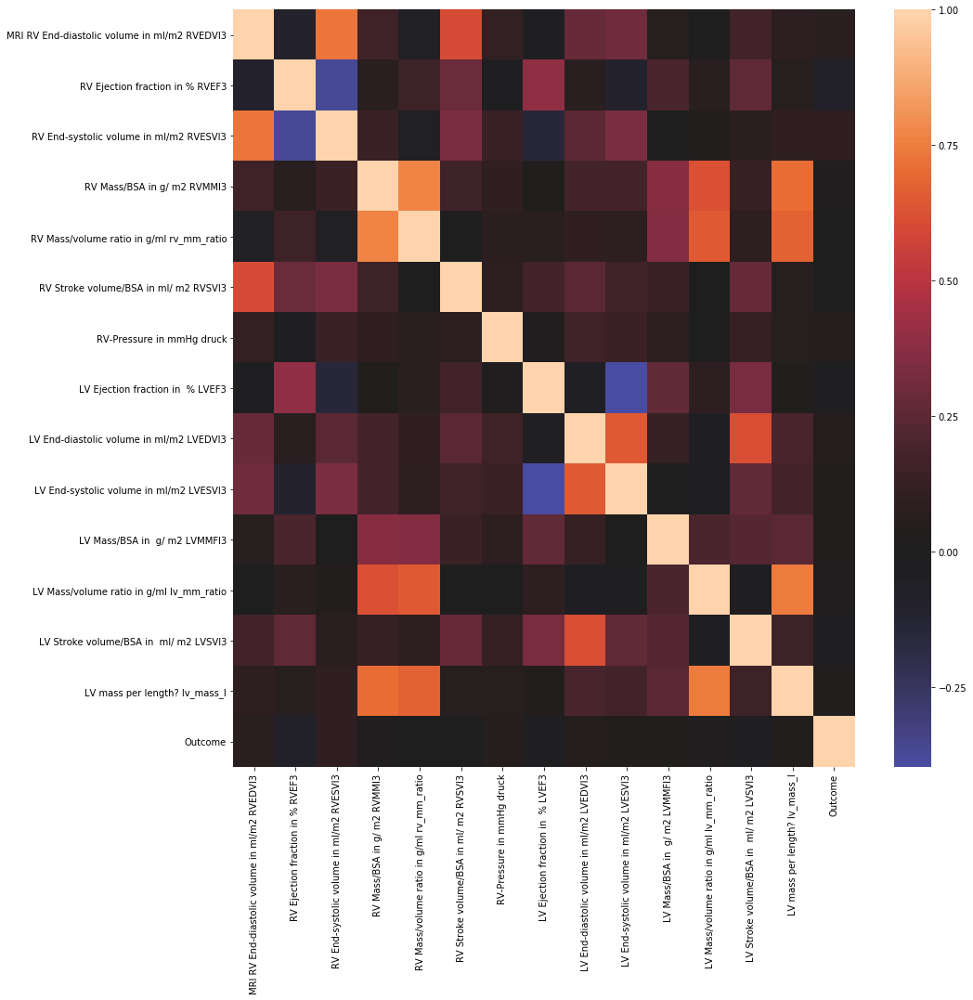

In [20]:
# plot heatmap without values
fig, ax = plt.subplots(figsize=(15,15))  
se.heatmap(selected_data.corr(method='kendall'),center=0, ax=ax)

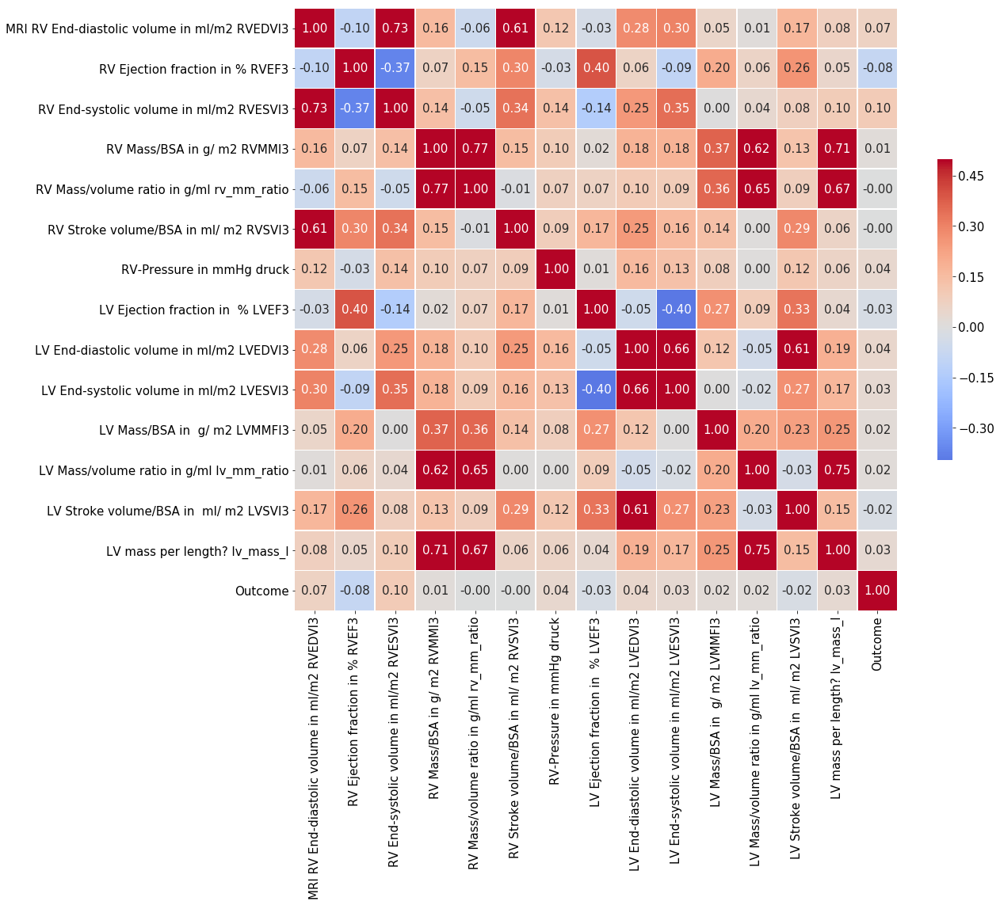

In [54]:
# normalise columnwise 
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
selected_data_norm = pd.DataFrame(min_max_scaler.fit_transform(selected_data), columns=selected_data.columns, index=selected_data.index)

# plot corr heatmap with values
fig, ax = plt.subplots(figsize=(18,14)) 
corr = selected_data_norm.corr(method='kendall')
g = se.heatmap(corr,  vmax=.5, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
#se.despine()
#g.figure.set_size_inches(18,14)
g.figure.savefig('reports/gcn_correlation_mri_data.pdf', bbox_inches="tight")

In [31]:
# scatter plot volume correlations
plt.clf()
g = se.pairplot(selected_data_norm, height=10, hue="Outcome")
plt.savefig('reports/gcn_pairwisescatter_mri_data.pdf')

/home/sven/anaconda3/envs/dl/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/sven/anaconda3/envs/dl/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/sven/anaconda3/envs/dl/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


<Figure size 432x288 with 0 Axes>

# Categorical correlations

## transform to numerical data

In [23]:
# transform all categorical values to numeric
# drop all columns with only nan
# replace single nan entries with 0
# drop manual index
df = df_merged.apply(pd.to_numeric, errors='coerce').dropna(axis=1,how='all')
df = df.fillna(0)
df = df.loc[:, (df != 0).any(axis=0)]
df_merged_numeric = df.drop(['Anzahl der Datensätze'],axis=1)
df_merged_numeric.head()

,? vt,Age at corrective surgery (years) Alter_correctOP,Age at enrollment (years) age,Age at palliation (years) alter_palliation,Antiarrhythmic medication in % yes or no antiarrhyth_c,Aortic insufficiency grades 0-4 aortinsuf,Aortic regurgitation fraction in % AAoRFflow,BMI BMI,Birth weight in grams gebgewicht,Blood pressure diastolic in mmHg rrdias,...,School school,VO2_AT_BSA,VO2_peak_BSA,Weight at corrective surgery in kg opweight,Weight in kg (percentile) weight,Year of corrective surgery Jahr der Korrektur,Year of the redo surgeries Jahr der Redos,redo after V1 RE OP nach V1,surgery date while enrolled in study OP Datum während Studie,tricuspid insufficiency grades 0-4 tricinsuf
0,1.0,3.0,24.0,1.0,0.0,0.0,0.79,23.040020,0.0,64.0,...,0.0,0.939767,1.202271,13.20,73.0,410227200000000000,0.0,0.0,-9223372036854775808,2.0
1,1.0,1.0,14.0,0.0,0.0,0.0,0.00,36.678201,0.0,58.0,...,1.0,0.958901,1.144195,10.00,106.0,694224000000000000,0.0,0.0,-9223372036854775808,0.0
2,1.0,0.0,10.0,0.0,0.0,0.0,0.00,16.068053,0.0,55.0,...,4.0,0.817777,1.117629,8.04,30.6,788918400000000000,0.0,0.0,-9223372036854775808,0.0
3,1.0,0.0,12.0,0.0,0.0,0.0,0.00,14.872829,0.0,66.0,...,4.0,0.845896,1.070470,7.60,37.6,725846400000000000,1994.0,0.0,-9223372036854775808,0.0
4,1.0,0.0,16.0,0.0,0.0,0.0,0.00,37.856260,0.0,64.0,...,1.0,1.086130,1.206316,10.20,113.3,631152000000000000,0.0,0.0,-9223372036854775808,2.0


In [24]:
df_merged_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 0 to 412
Data columns (total 76 columns):
? vt                                                                                        413 non-null float64
Age at corrective surgery (years) Alter_correctOP                                           413 non-null float64
Age at enrollment (years) age                                                               413 non-null float64
Age at palliation (years) alter_palliation                                                  413 non-null float64
Antiarrhythmic medication in %   yes or no antiarrhyth_c                                    413 non-null float64
Aortic insufficiency grades 0-4 aortinsuf                                                   413 non-null float64
Aortic regurgitation fraction in % AAoRFflow                                                413 non-null float64
BMI BMI                                                                                     413 non-null

## Corr heatmap plot with values

https://www.dummies.com/education/math/statistics/how-to-interpret-a-correlation-coefficient-r/

Exactly –1. A perfect downhill (negative) linear relationship

–0.70. A strong downhill (negative) linear relationship

–0.50. A moderate downhill (negative) relationship

–0.30. A weak downhill (negative) linear relationship

0. No linear relationship

+0.30. A weak uphill (positive) linear relationship

+0.50. A moderate uphill (positive) relationship

+0.70. A strong uphill (positive) linear relationship

Exactly +1. A perfect uphill (positive) linear relationship

<Figure size 432x288 with 0 Axes>

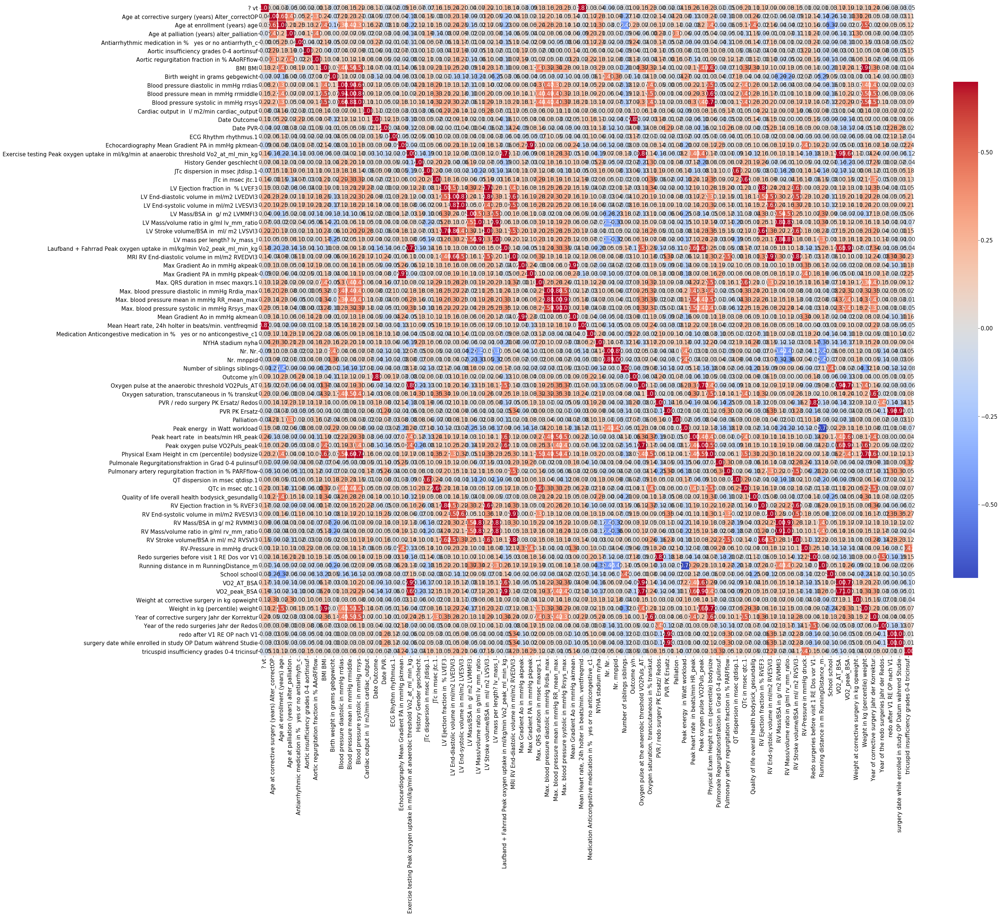

In [25]:
plt.rcParams.update({'font.size': 15})
plt.clf()
fig, ax = plt.subplots(figsize=(40,50)) 
corr = df_merged_numeric.corr()
se.heatmap(corr,  vmax=.7, center=0, ax=ax, square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
plt.savefig('reports/gcn_correlation_all_features.pdf')

## Scatter plot categorical correlation 

In [43]:
plt.clf()
se.set(style="ticks", color_codes=True)
g = se.pairplot(df_merged_numeric, height=3, hue="Outcome y/n")

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

# Pandas hexbin right/left EF correlations with quality of life

In [ ]:
# right/left EF vs outcome
fig, ax = plt.subplots(figsize=(20,15))
plt.rcParams.update({'font.size': 30})
df_merged_numeric.plot.hexbin(x='LV Ejection fraction in  % LVEF3', y='RV Ejection fraction in % RVEF3', C='Quality of life overall health bodysick_gesundallg',  reduce_C_function=np.max,gridsize=25, ax=ax)

# seaborn jointplot for two columns (scatter + histogram)

In [ ]:
import seaborn as sns; sns.set(style="white", color_codes=True)
plt.rcParams.update({'font.size': 40})
g = sns.jointplot(x="LV Ejection fraction in  % LVEF3", y='RV Ejection fraction in % RVEF3', data=df_merged_numeric)

In [ ]:
g = sns.jointplot(x="LV Ejection fraction in  % LVEF3", y='RV Ejection fraction in % RVEF3', data=df_merged_numeric, kind='hex')

In [ ]:
g = sns.jointplot(x="LV Ejection fraction in  % LVEF3", y='RV Ejection fraction in % RVEF3', data=df_merged_numeric, kind='reg')

In [ ]:
g = sns.jointplot(x="LV Ejection fraction in  % LVEF3", y='RV Ejection fraction in % RVEF3', data=df_merged_numeric, kind="kde", space=0, color="g")

# Normalize the dataframe columnwise

In [35]:
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
selected_data_norm = pd.DataFrame(min_max_scaler.fit_transform(selected_data), columns=selected_data.columns, index=selected_data.index)

# Andreas Curves

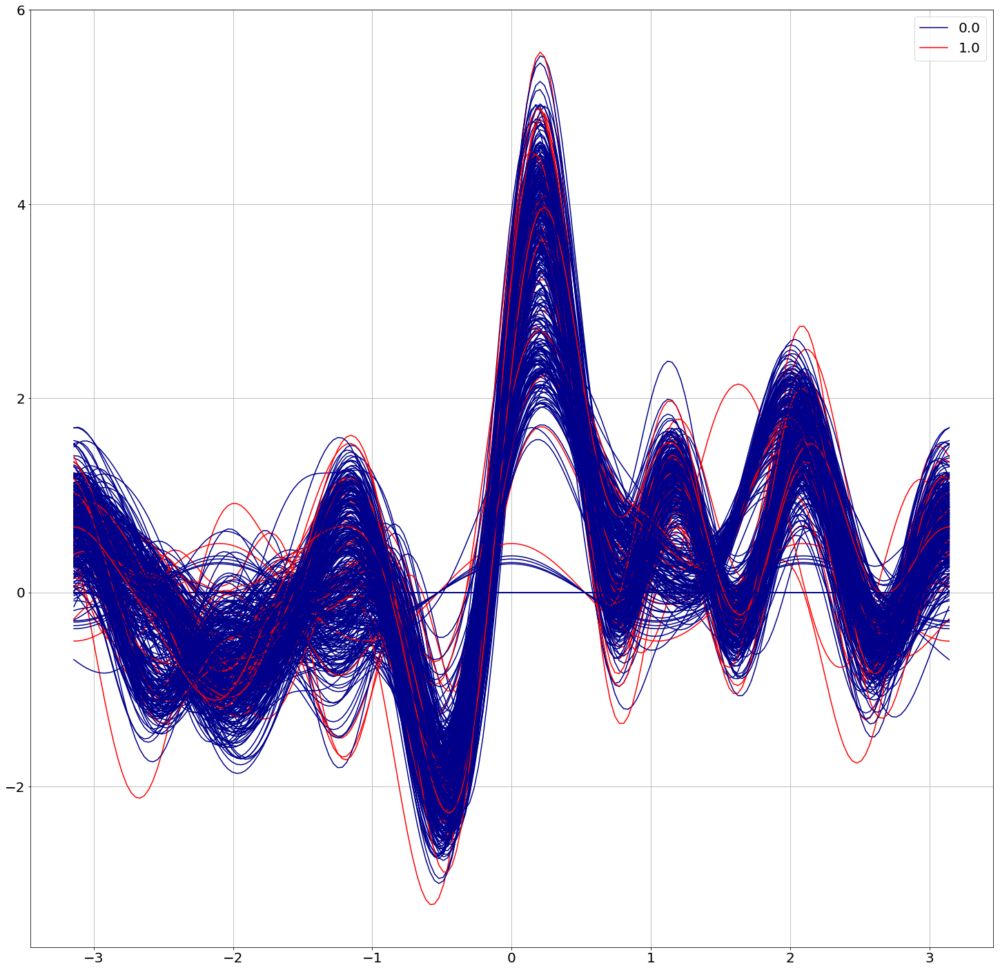

In [58]:
from pandas.plotting import andrews_curves

plt.rcParams.update({'font.size': 20})
fig, ax = plt.subplots(figsize=(25,25))
andrews_curves(selected_data_norm, 'Outcome', color=('darkblue', 'red'), ax=ax)
plt.savefig('reports/gcn_andreas_curves.pdf')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 <a list of 14 Text xticklabel objects>)

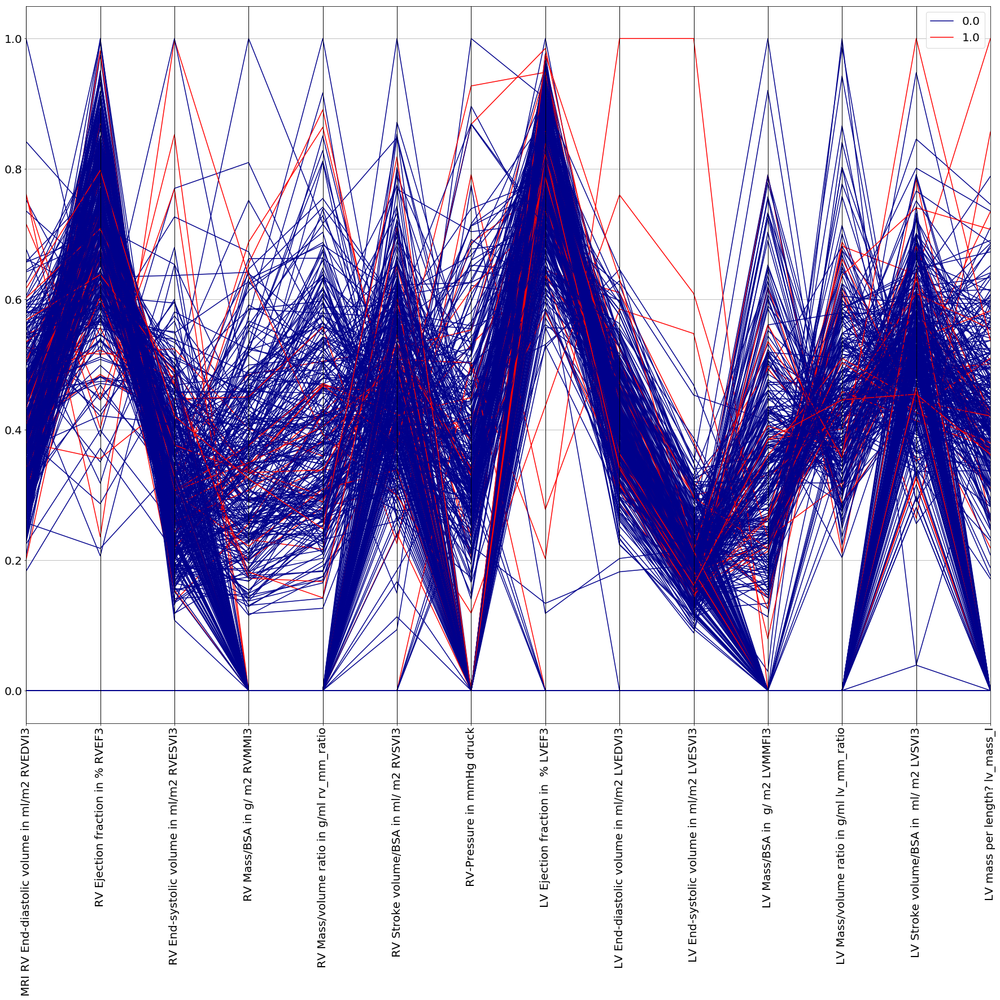

In [59]:
from pandas.plotting import parallel_coordinates

plt.rcParams.update({'font.size': 20})

fig, ax = plt.subplots(figsize=(25,25))
parallel_coordinates(selected_data_norm, "Outcome", ax=ax, color=('darkblue', 'red'), sort_labels=True)

plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('reports/gcn_parallel_coordinates.pdf')

In [38]:
selected_data.head()

,MRI RV End-diastolic volume in ml/m2 RVEDVI3,RV Ejection fraction in % RVEF3,RV End-systolic volume in ml/m2 RVESVI3,RV Mass/BSA in g/ m2 RVMMI3,RV Mass/volume ratio in g/ml rv_mm_ratio,RV Stroke volume/BSA in ml/ m2 RVSVI3,RV-Pressure in mmHg druck,LV Ejection fraction in % LVEF3,LV End-diastolic volume in ml/m2 LVEDVI3,LV End-systolic volume in ml/m2 LVESVI3,LV Mass/BSA in g/ m2 LVMMFI3,LV Mass/volume ratio in g/ml lv_mm_ratio,LV Stroke volume/BSA in ml/ m2 LVSVI3,LV mass per length? lv_mass_I,Outcome
0,158.24,49.635036,79.696405,39.165690,0.247512,78.541385,43.4,56.591797,107.52,46.67,0.74,0.60,60.85,64.37,0
1,72.45,51.342711,35.252334,31.963351,0.441176,37.197929,0.0,67.392832,65.92,21.49,0.60,0.74,44.42,48.83,0
2,147.56,52.817337,69.621713,0.000000,0.000000,77.936117,23.5,59.274756,65.51,26.68,0.00,0.00,38.83,0.00,0
3,111.95,47.638327,58.617548,39.053186,0.348853,53.329883,0.0,66.529351,73.35,24.55,1.30,0.60,48.80,43.89,0
4,102.89,53.543647,47.798141,41.439876,0.402766,55.090136,28.3,56.302083,85.37,37.30,0.38,0.90,48.06,76.74,0


# create a radar chart from volume data

In [100]:

def plot_radar_chart(df, index=0, ax=None):
    
    """
    creates a radar plot for one row, defined by index
    creates a new axis if non is provided, draw on provided else
    dataframe needs the structure: one entity per row, each column = one attribute
    """
    
    from math import pi

    # number of variables
    if list(df)[0] == 'index':
        categories=list(df)[1:]
    else:
        categories=list(df)
    N = len(categories)

    # We are going to plot the n line of the data frame.
    # But we need to repeat the first value to close the circular graph:
    values=df[categories].loc[index].values.flatten().tolist()
    values += values[:1]

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    if ax is None:
        f = plt.figure(figsize=(15,15))
        ax = f.add_subplot(111, polar=True)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, size=20)

    # Draw ylabels

    # Plot data
    ax.plot(angles, values, linewidth=1, linestyle='solid')

    # Fill area
    ax.fill(angles, values, alpha=0.1)
    #plt.title(df_merged['PID'].loc[index])
    plt.tight_layout()
    return ax

    

# plot all patient volume shape metrics with outcome == 1 and 0

Text(0.5, 1.05, '')

Text(0.5, 1.05, '')

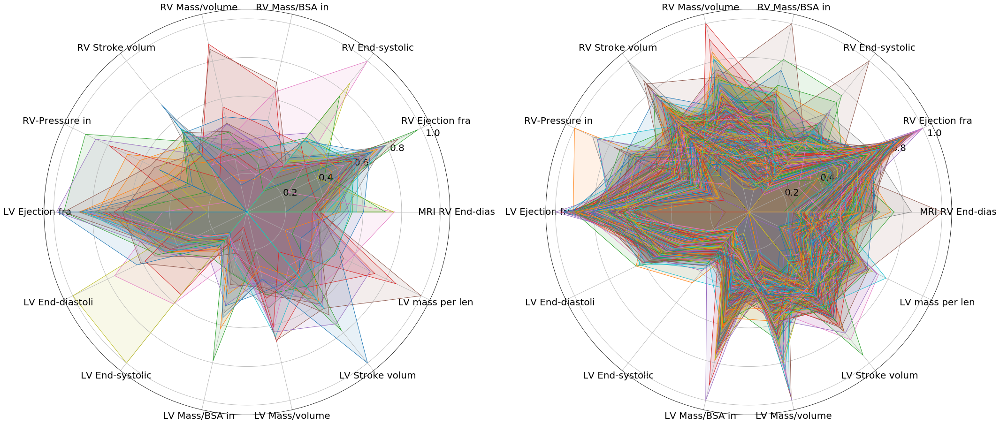

In [101]:
plt.rcParams.update({'font.size': 20})
df_pos = selected_data_norm[selected_data_norm['Outcome'] == 1].drop('Outcome', axis=1)
df_pos.reset_index(inplace=True)

f = plt.figure(figsize=(30,15))
ax = f.add_subplot(121, polar=True)
for i in range(len(df_pos)-1):
    ax = plot_radar_chart(df_pos, i, ax)
    
ax.set_title('')
df_pos = selected_data_norm[selected_data_norm['Outcome'] == 0].drop('Outcome', axis=1)
df_pos.reset_index(inplace=True)

ax = f.add_subplot(122, polar=True)
for i in range(len(df_pos)-1):
    ax = plot_radar_chart(df_pos, i, ax)
plt.title('')
plt.tight_layout()
plt.show()
f.savefig('reports/radarplots_MRI_data.pdf')


# plot mean volume shape grouped by outcome

In [93]:
temp_ = selected_data_norm.columns

In [94]:
temp = [elem[:15] for elem in temp_]
selected_data_norm.columns = temp

Text(0.5, 1.05, '')

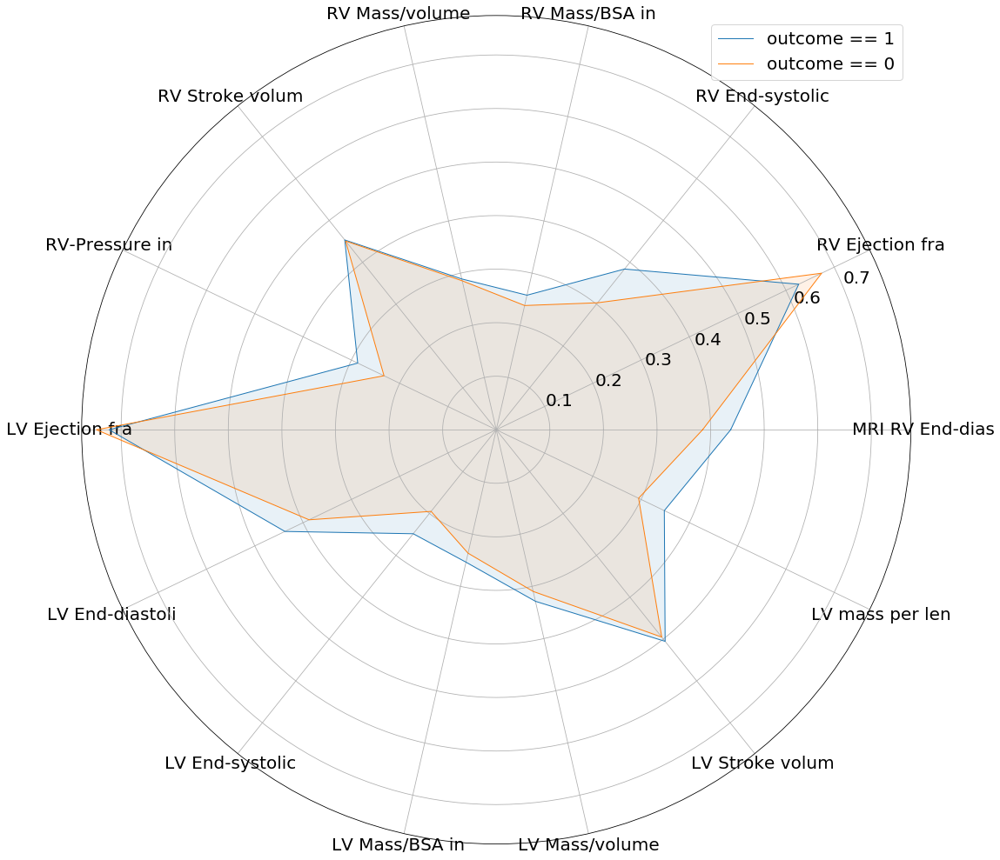

In [102]:

plt.rcParams.update({'font.size': 20})
# plot average shape infos for outcome = 1
df_pos = selected_data_norm[selected_data_norm['Outcome'] == 1].drop('Outcome', axis=1)
df_temp = pd.DataFrame(columns=df_pos.columns)
df_temp.loc[0] = df_pos.mean().values
# define figure

f = plt.figure(figsize=(30,15))
ax = f.add_subplot(111, polar=True)
# draw and update axis
ax = plot_radar_chart(df_temp, 0, ax)
# plot average shape infos for outcome = 0
df_pos = selected_data_norm[selected_data_norm['Outcome'] == 0].drop('Outcome', axis=1)
df_temp = pd.DataFrame(columns=df_pos.columns)
df_temp.loc[0] = df_pos.mean().values
# draw and update axis
ax = plot_radar_chart(df_temp, 0, ax)
#f.tight_layout()
plt.legend(['outcome == 1', 'outcome == 0'], loc='upper right')
plt.title('')
f.savefig('reports/radarplots_average_MRI_data.pdf')

# plot all patient volume shape metrics with outcome = 0

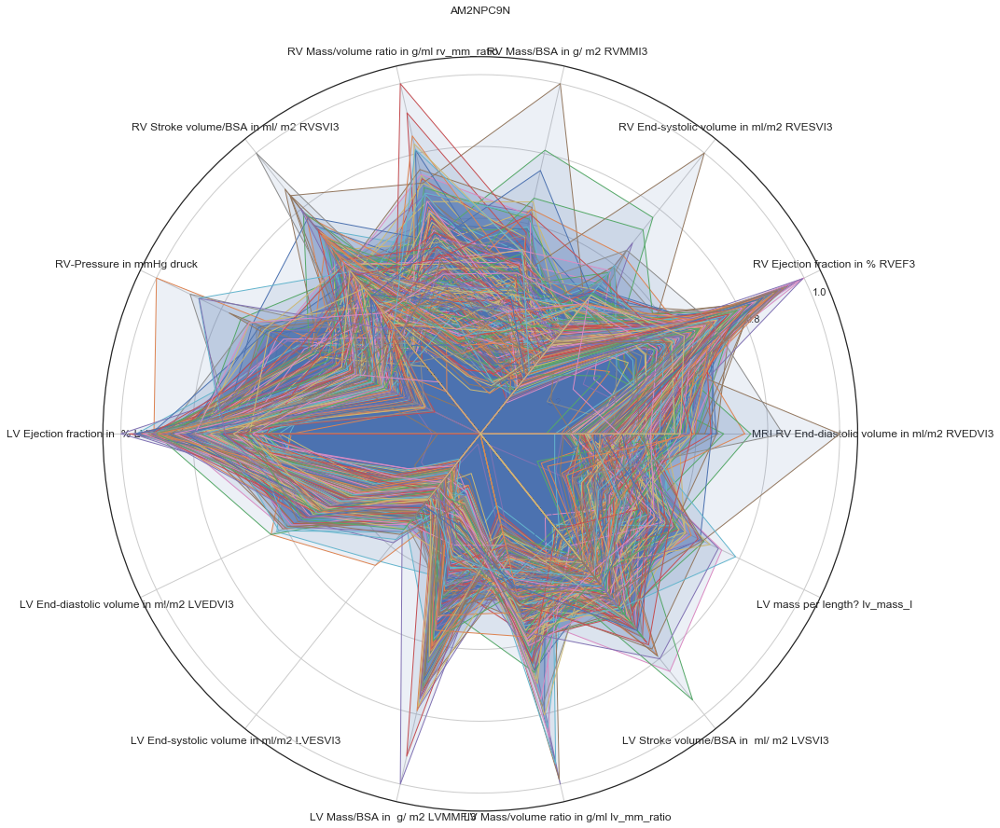

In [181]:
df_pos = selected_data_norm[selected_data_norm['Outcome'] == 0].drop('Outcome', axis=1)
df_pos.reset_index(inplace=True)

f = plt.figure(figsize=(15,15))
ax = f.add_subplot(111, polar=True)
for i in range(len(df_pos)-1):
    ax = plot_radar_chart(df_pos, i, ax)

In [41]:
df = selected_data_norm
@interact
def interact_radar_plot(index=(0,len(df)-1)):
    plot_radar_chart(df, index)

interactive(children=(IntSlider(value=206, description='index', max=412), Output()), _dom_classes=('widget-int…

# normalize numeric dataframe

In [114]:
min_max_scaler = preprocessing.MinMaxScaler()
df_merged_numeric_norm = pd.DataFrame(min_max_scaler.fit_transform(df_merged_numeric), columns=df_merged_numeric.columns, index=df_merged_numeric.index)


C:\Users\s.koehler\AppData\Local\conda\conda\envs\sv\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


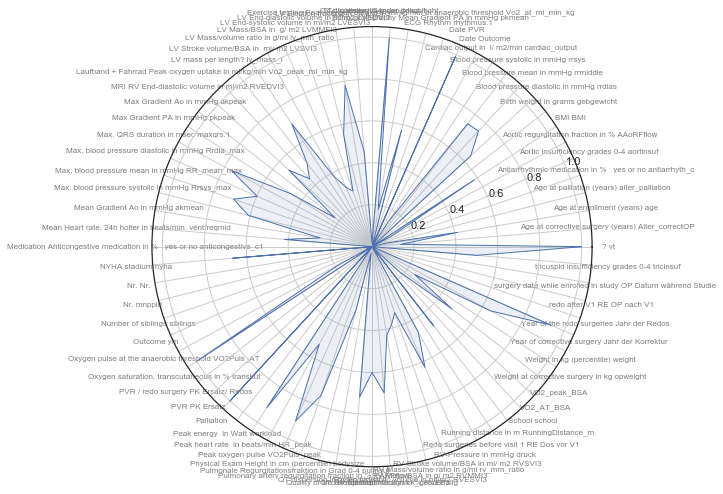

In [117]:
plot_radar_chart(df_merged_numeric_norm, 0)

## corr heatmap plot without values

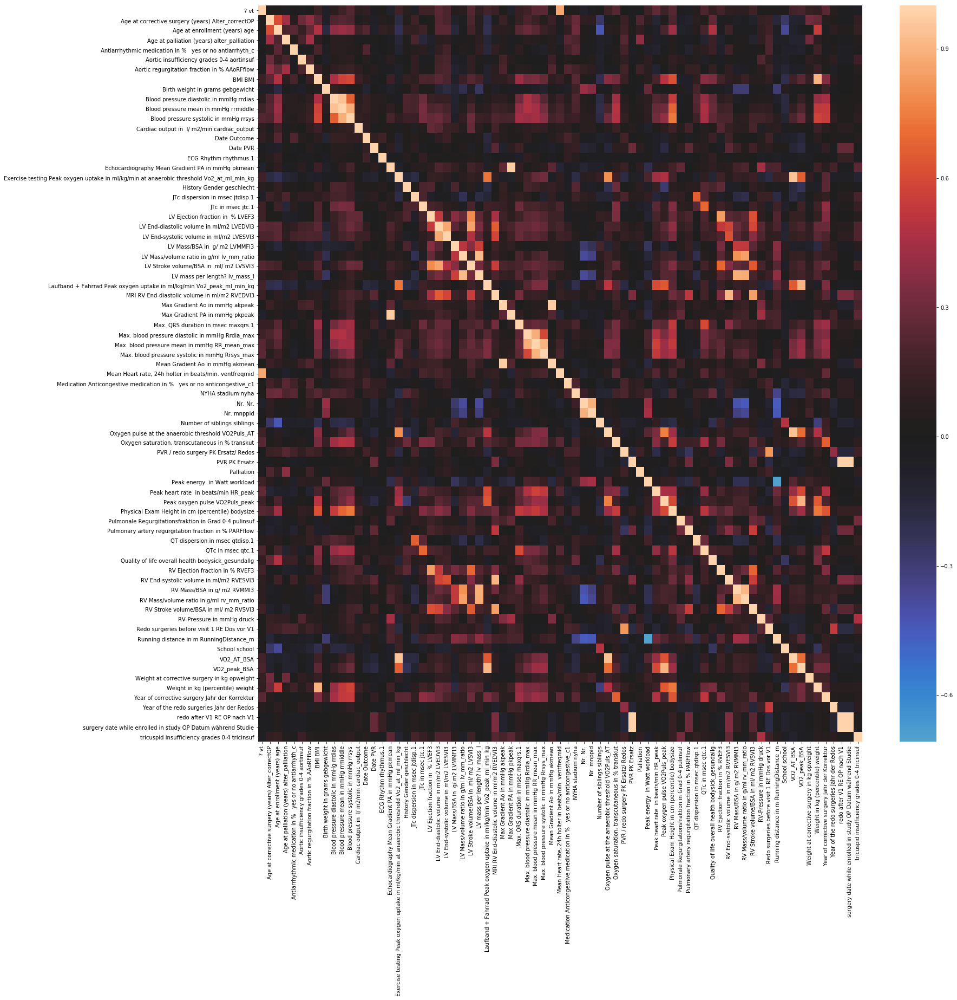

In [22]:
fig, ax = plt.subplots(figsize=(25,25))  
se.heatmap(df_merged_numeric.corr(), center=0,ax=ax)

['MRI RV End-diastolic volume in ml/m2 RVEDVI3',
 'RV Ejection fraction in % RVEF3',
 'RV End-systolic volume in ml/m2 RVESVI3',
 'RV Mass/BSA in g/ m2 RVMMI3',
 'RV Mass/volume ratio in g/ml rv_mm_ratio',
 'RV Stroke volume/BSA in ml/ m2 RVSVI3',
 'RV-Pressure in mmHg druck']